In [2]:
import numpy as np
import torch
import torch.nn as nn
from torch.optim import Adam
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tfs
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import pickle
from sklearn.manifold import TSNE
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import LeaveOneOut, cross_val_score

In [3]:
def show_images(imgs, size=(8, 8)):
    fig, ax = plt.subplots(figsize=(size[0]*2, size[1]*2))
    ax.set_xticks([])
    ax.set_yticks([])
    nmax = size[0] * size[1]
    ax.imshow(
        make_grid(imgs[:nmax], nrow=size[0]).permute(1, 2, 0)
    )

In [4]:
def show_history(history):
    plt.figure(figsize=(20, 6))

    plt.subplot(1, 2, 1)
    plt.plot(range(1, EPOCHS+1), history[0]['generator'], label='generator')
    plt.plot(range(1, EPOCHS+1), history[0]['discriminator'], label='discriminator')
    plt.legend(loc='lower right')
    plt.title('BCE Loss')

    plt.subplot(1, 2, 2)
    plt.plot(range(1, EPOCHS+1), history[1]['real'], label='real')
    plt.plot(range(1, EPOCHS+1), history[1]['fake'], label='fake')
    plt.legend(loc='upper left')
    plt.title('Accuracy')

    plt.show()

In [5]:
def generate(model, size):
    imgs = torch.Tensor()
    model.eval()
    with torch.no_grad():
        while size > 0:
            latent = torch.randn(
                min(size, BATCH_SIZE), LATENT_SIZE, 1, 1, device=DEVICE
            )
            imgs = torch.cat([imgs, model(latent).cpu()])
            size = size - BATCH_SIZE
    return imgs

In [6]:
def generate2(model,model2, size):
    imgs = torch.Tensor()
    model.eval()
    model2.eval()
    with torch.no_grad():
        while size > 0:
            latent = torch.randn(
                min(size, BATCH_SIZE), LATENT_SIZE, 1, 1, device=DEVICE
            )
            imgs = torch.cat([imgs, model2(model(latent)).cpu()])
            size = size - BATCH_SIZE
    return imgs

# 1. Load data

In [7]:
DATA_DIR = '/kaggle/input/flickr-faces-70k-thumbnails-128x128/'
DATA_OUT = '/kaggle/input/gan-flickr-faces-output/'
#NORMS = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
BATCH_SIZE = 120
DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

In [7]:
dataset = ImageFolder(DATA_DIR, transform=tfs.Compose([
    tfs.ToTensor(),
#    tfs.Normalize(*NORMS),
]))

dataloader = DataLoader(
    dataset, BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True
)

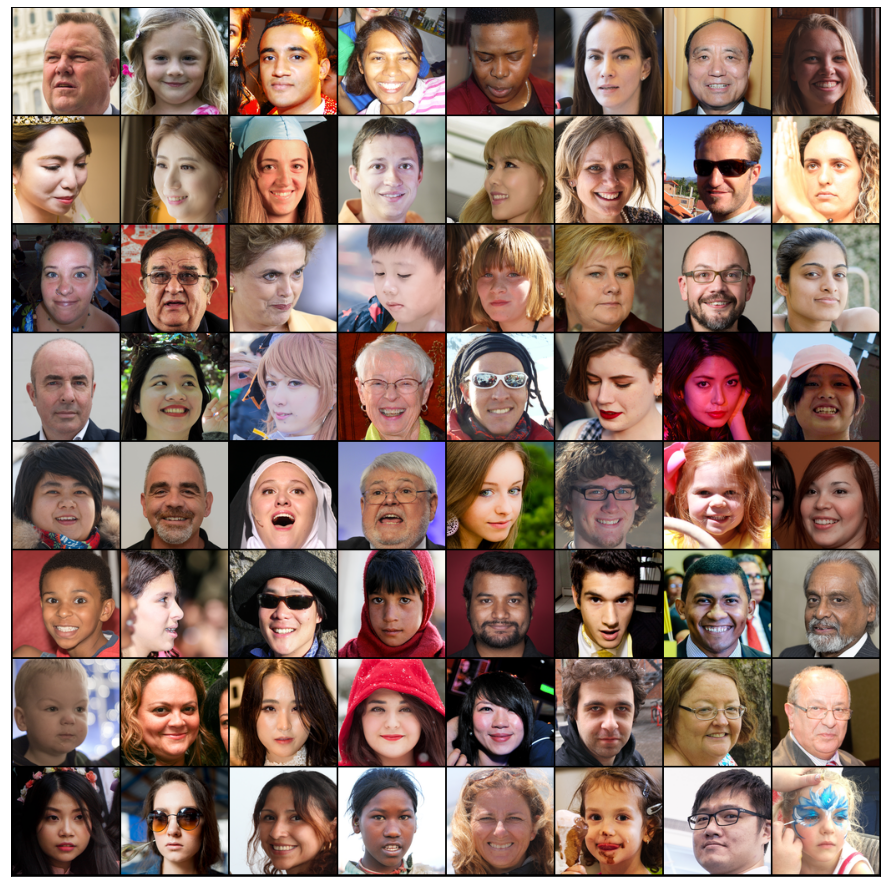

In [8]:
test_imgs, _ = next(iter(dataloader))
show_images(test_imgs)

# 2. Model

In [8]:
discriminator = nn.Sequential(
    # in: 3 x 128 x 128
    nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(32),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 32 x 64 x 64

    nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()

).to(DEVICE)

In [9]:
discriminator2 = nn.Sequential(
    # in: 3 x 128 x 128
    nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(32),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 32 x 64 x 64
    
    nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1, bias=False),
    nn.BatchNorm2d(32),
    nn.LeakyReLU(0.2, inplace=True),

    nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    
    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()

).to(DEVICE)

In [10]:
LATENT_SIZE = 128

In [11]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(LATENT_SIZE, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # nn.Dropout(0.5),
    # out: 1024 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # nn.Dropout(0.5),
    # out: 512 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # nn.Dropout(0.5),
    # out: 256 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # nn.Dropout(0.5),
    # out: 128 x 32 x 32

    nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(32),
    nn.ReLU(True),
    # nn.Dropout(0.5),
    # out: 64 x 64 x 64

    # nn.ConvTranspose2d(64, 32, kernel_size=1, stride=1, padding=0, bias=False),
    # nn.BatchNorm2d(32),
    # nn.ReLU(True),
    
    nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 128 x 128

).to(DEVICE)    

In [12]:
generatorm1 = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(LATENT_SIZE, 768, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(768),
    nn.ReLU(True),
    # nn.Dropout(0.5),
    # out: 1024 x 4 x 4    
    
    #nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
    #nn.BatchNorm2d(512),
    #nn.ReLU(True),    

    nn.ConvTranspose2d(768, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # nn.Dropout(0.5),
    # out: 512 x 8 x 8

    #nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
    #nn.BatchNorm2d(512),
    #nn.ReLU(True),
    
    
    # out: 3 x 128 x 128

).to(DEVICE)    


generatorm2 = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # nn.Dropout(0.5),
    # out: 256 x 16 x 16

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # nn.Dropout(0.5),
    # out: 128 x 32 x 32

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # nn.Dropout(0.5),
    # out: 64 x 64 x 64
    
        
    
    # out: 3 x 128 x 128

).to(DEVICE)
'''
 self.conv31 = nn.Sequential(
            nn.Conv2d(32, 16, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU()
        )
        
        self.conv32 = nn.Sequential(
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU()
        )
        self.conv33 = nn.Sequential(            
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
'''
class generatorm21(nn.Module):
    def __init__(self):
        super(generatorm21, self).__init__()
        self.inchannel = 64
        self.conv1 = nn.Sequential(
            nn.Conv2d(64, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU()
        )
        
        self.conv11 = nn.Sequential(
            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU()
        )
        
        
        self.conv2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )        
        
       
    def forward(self, x):  
       
        out1 = self.conv1(x)        
        out2 = self.conv11(out1)
        out2 = self.conv2(out2)
        out2=out2+x
        
        '''        
        out3= self.conv1(x)        
        out5= self.conv11(out3)
        out5= self.conv31(out5)
        out5= self.conv32(out5)
        out5= self.conv2(out5)
        out5 = out5+out2 
        '''
        #out5 = self.conv33(out5)
        return out2
generatorm3 = nn.Sequential(
    # in: latent_size x 1 x 1

   
    
    nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(32),
    nn.ReLU(True)    
    
    
    # out: 3 x 128 x 128

).to(DEVICE)


class generatorm51(nn.Module):
    def __init__(self):
        super(generatorm51, self).__init__()
        self.inchannel = 64
        self.conv1 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        
        self.conv11 = nn.Sequential(
            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU()
        )
        
        
        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU()
        )
        
        
        self.conv3 = nn.Sequential(
            nn.Conv2d(32, 3, kernel_size=3, stride=1, padding=1),
            
        )
    
    def forward(self, x):  
       
        out1 = self.conv1(x)        
        out2 = self.conv2(out1)
        #print(out1.shape)
        out2 = out2+x
                
        out3= self.conv1(out2)        
        out5= self.conv2(out3)
        out5 = out5+out2
        
        out6= self.conv11(out5)  
        out6= self.conv3(out6)
        
        out6 = nn.Tanh()(out6)
        
        return out6
generatorm51 = generatorm51().to(DEVICE) 

generatorm21= generatorm21().to(DEVICE) 

generatorm5 = nn.Sequential(
    # in: latent_size x 1 x 1
    
    
    nn.Conv2d(32, 3, kernel_size=3, stride=1, padding=1),    
    nn.Tanh()    
    
    # out: 3 x 128 x 128

).to(DEVICE)



generatorm = nn.Sequential(
    # in: latent_size x 1 x 1
    generatorm1,
    generatorm2,
    generatorm21,
    generatorm3,
    generatorm51
    # out: 3 x 128 x 128

).to(DEVICE)

In [13]:
class generatorNext(nn.Module):
    def __init__(self):
        super(generatorNext, self).__init__()
        self.inchannel = 64
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        
        self.pool1 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        
        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )
        self.pool2 = nn.Sequential(
            nn.Conv2d(128, 128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )
        self.pool3 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )
        self.conv5 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )
        self.pool5 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )
        
        self.conv51 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )
        
        
        self.conv6 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(True)
        )
        
        self.conv7 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(True)
        )
        
        self.conv8 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True)
        )
    
        self.conv9 = nn.Sequential(
            nn.ConvTranspose2d(64, 64, kernel_size=4, stride=2, padding=1),
            
        )
        
        self.conv10 = nn.Sequential(
            nn.Conv2d(64, 3, kernel_size=3, stride=1, padding=1),
            
        )
    
    def forward(self, x):  
        '''
        torch.Size([128, 64, 64, 64])
        torch.Size([128, 128, 32, 32])
        torch.Size([128, 256, 16, 16])
        torch.Size([128, 512, 8, 8])
        torch.Size([128, 512, 8, 8])
        torch.Size([128, 256, 15, 15])
        '''
        out1 = self.conv1(x)        
        out1 = self.pool1(out1)  #64
        #print(out1.shape)
        
        out2 = self.conv2(out1)        
        out2 = self.pool2(out2)  #32
        #print(out2.shape)
        
        out3 = self.conv3(out2)        
        out3 = self.pool3(out3)  #16
        #print(out3.shape)
        
        out5 = self.conv5(out3)        
        out5 = self.pool5(out5) #8
        #print(out5.shape)
        
        out51 = self.conv51(out5)
        #print(out51.shape)
        
        out6 = self.conv6(out51) #16       
        #print(out6.shape)
        out6 = out6+out3
        
        out7 = self.conv7(out6)  #32      
        #print(out7.shape)
        out7 = out7+out2
        
        out8 = self.conv8(out7)  #64      
        #print(out8.shape)
        out8 = out8+out1
        
        out9 = self.conv9(out8)  #128
        #print(out9.shape)
               
        out10 = self.conv10(out9)  
        #print(out10.shape)
        
        out10 = nn.Tanh()(out10)
        
        return out10

In [14]:
generatorN = generatorNext().to(DEVICE)  
#discriminator2 = discriminator2().to(DEVICE) 

In [15]:
LR = 0.0001

model = {
    'discriminator': discriminator,
    'discriminator2': discriminator2,
    'generator': generator,
    'generatorm': generatorm,   
    'generatorN':generatorN
}

criterion = {
    'discriminator': nn.BCELoss(),
    'discriminator2': nn.BCELoss(),
    'generator': nn.BCELoss(),
    'generatorm': nn.BCELoss(),   
    'generatorN':nn.BCELoss()
}

optimizer = {
    'discriminator': Adam(
        model['discriminator'].parameters(), lr=LR, betas=(0.5, 0.999)
    ),
    'discriminator2': Adam(
        model['discriminator2'].parameters(), lr=LR, betas=(0.5, 0.999)
    ),
    'generator': Adam(
        model['generator'].parameters(), lr=LR, betas=(0.5, 0.999)
    ),
    'generatorm': Adam(        
         model['generatorm'].parameters(), lr=LR, betas=(0.5, 0.999)  #(generatorm2.parameters(),generatorm3.parameters(),generatorm5.parameters())
    ),   
    'generatorN': Adam(
        model['generatorN'].parameters(), lr=LR, betas=(0.5, 0.999)
    )
}
for name, value in generatorm1.named_parameters():
    value.requires_grad = True
    

In [65]:
#!cp ../input/genexec50/* ../working/.
!cp ../input/disexec006/* ../working/.
!cp ../input/gen3exec007/* ../working/.

In [81]:
#checkpoint = torch.load('gen1next_epoch_1.weights')

torch.save(model['generatorm'].state_dict(), 'gen1next_epoch_1.weights')
torch.save(model['discriminator'].state_dict(), 'dis1next_epoch_1.weights')

In [27]:
def fit2(model, criterion, optimizer, epochs, disname,genname,startnum,save_results = False):
    # Losses & scores
    losses = {
        'discriminator': [],
        'discriminator2': [],
        'generator': [],
        'generatorm': []
    }
    scores = {
        'real': [],
        'fake': []
    }

    def trainGen(genname):
        model[genname].train()
            
        # Clear generator gradients
        optimizer[genname].zero_grad()
            
        # Generate fake images
        
        latent = torch.randn(BATCH_SIZE, LATENT_SIZE, 1, 1, device=DEVICE)
        fake_images2 = model[genname](latent)
        
            
        # Try to fool the discriminator
        #with torch.no_grad():
        preds = model['discriminator'](fake_images2)
        targets = torch.ones(BATCH_SIZE, 1, device=DEVICE)
        loss_g = criterion[genname](preds, targets)
            
        # Update generator weights
        loss_g.backward()
        #nn.utils.clip_grad_norm_(model[genname].parameters(), max_norm=20, norm_type=2)
        optimizer[genname].step()
    
    def trainDis(disname,genname):
        for real_images, _ in tqdm(dataloader):
            real_images = real_images.to(DEVICE)

            # Train discriminator

            # Clear discriminator gradients
            optimizer[disname].zero_grad()
            
            # Pass real images through discriminator
            real_preds = model[disname](real_images)
            real_targets = torch.ones(real_images.size(0), 1, device=DEVICE)
            real_loss = criterion[disname](real_preds, real_targets)
            real_score = torch.mean(real_preds).item()
            
            # Generate fake images
            latent = torch.randn(BATCH_SIZE, LATENT_SIZE, 1, 1, device=DEVICE)
            fake_images = model[genname](latent)
           

            # Pass fake images through discriminator
            fake_targets = torch.zeros(BATCH_SIZE, 1, device=DEVICE)
            fake_preds = model[disname](fake_images)
            fake_loss = criterion[disname](fake_preds, fake_targets)
            fake_score = torch.mean(fake_preds).item()

            
            # Update discriminator weights
            loss_d = real_loss + fake_loss
            loss_d.backward()                     
            
            optimizer[disname].step()
            if real_score>=0.56:
                break
        return
    #trainDis(disname,genname)
    for epoch in range(startnum,epochs):
        loss_per_epoch = {
            'discriminator': [],
            'discriminator2': [],
            'generator': [],
            'generatorm': []
        }
        score_per_epoch = {
            'real': [],
            'fake': []
        }
        
        for real_images, _ in tqdm(dataloader):
            real_images = real_images.to(DEVICE)

            # Train discriminator

            # Clear discriminator gradients
            optimizer[disname].zero_grad()
            
            # Pass real images through discriminator
            real_preds = model[disname](real_images)
            real_targets = torch.ones(real_images.size(0), 1, device=DEVICE)
            real_loss = criterion[disname](real_preds, real_targets)
            real_score = torch.mean(real_preds).item()
            
            # Generate fake images
            latent = torch.randn(BATCH_SIZE, LATENT_SIZE, 1, 1, device=DEVICE)
            fake_images = model[genname](latent)
            

            # Pass fake images through discriminator
            fake_targets = torch.zeros(BATCH_SIZE, 1, device=DEVICE)
            fake_preds = model[disname](fake_images)
            fake_loss = criterion[disname](fake_preds, fake_targets)
            fake_score = torch.mean(fake_preds).item()

            score_per_epoch['real'].append(real_score)
            score_per_epoch['fake'].append(fake_score)

            # Update discriminator weights
            loss_d = real_loss + fake_loss
            loss_d.backward()                     
            
            optimizer[disname].step()
            
            #if np.mean(score_per_epoch['real'])<=0.56:
            #    continue
            # Train generator
            loss_per_epoch[disname].append(loss_d.item())
            model[genname].train()
            
            # Clear generator gradients
            optimizer[genname].zero_grad()
            
            # Generate fake images
        
            latent = torch.randn(BATCH_SIZE, LATENT_SIZE, 1, 1, device=DEVICE)
            fake_images = model[genname](latent)
            #fake_images2 = model['generatorN'](fake_images)
            
            # Try to fool the discriminator
            #with torch.no_grad():
            preds = model[disname](fake_images)
            targets = torch.ones(BATCH_SIZE, 1, device=DEVICE)
            loss_g = criterion[genname](preds, targets)
            
            # Update generator weights
            loss_g.backward()
            #nn.utils.clip_grad_norm_(model[genname].parameters(), max_norm=20, norm_type=2)
            optimizer[genname].step()
            if loss_g.item()>6 or np.mean(score_per_epoch['fake'])<0.3:
                trainGen(genname)                
            #if loss_g.item()>6 or (np.mean(score_per_epoch['fake'])<0.3 and epoch>=30):
            #    trainGen(genname) 
            #if loss_g.item()>6 or (np.mean(score_per_epoch['fake'])<0.39 and epoch>=30):
            #    trainGen(genname) 
          
            loss_per_epoch[genname].append(loss_g.item())
            
            
            
        # Record losses & scores
        losses[genname].append(np.mean(loss_per_epoch[genname]))
        losses[disname].append(np.mean(loss_per_epoch[disname]))
        scores['real'].append(np.mean(score_per_epoch['real']))
        scores['fake'].append(np.mean(score_per_epoch['fake']))
        if np.mean(score_per_epoch['real'])>0.9:
            checkpoint2 = torch.load('dis1next_epoch_1.weights')
            model['discriminator'].load_state_dict(checkpoint2)
        # Log losses & scores (last batch)
        print(
            'Epoch [{}/{}], gen_loss: {:.4f}, dis_loss: {:.4f}, '
            'real_score: {:.4f}, fake_score: {:.4f}'.format(
                epoch+1, epochs, 
                losses[genname][-1], losses[disname][-1],
                scores['real'][-1], scores['fake'][-1]
            )
        )
        N_IMAGES = 56

        show_images(generate(model[genname], N_IMAGES), size=(8, 7))
        # Save results
        if save_results and ((epoch+1) in [1,3,6, 9,10,12,16,18,19, 20,36,39,50, 51,52]):
            imgs = generate(model[genname], 1000)
            with open(f'imgs_epoch_{epoch+1}.pkl', 'wb') as handle:
                pickle.dump(imgs, handle, protocol=pickle.HIGHEST_PROTOCOL)
            
            torch.save(
                model[genname].state_dict(),
                f'gen1next_epoch_{epoch+1}.weights'
            )
            torch.save(
                model[disname].state_dict(),
                f'dis1next_epoch_{epoch+1}.weights'
            )
    
    return losses, scores

In [ ]:

torch.save(
                model['generatorN'].state_dict(),
                f'gen2next_epoch_1.weights'
            )
torch.save(
                model['discriminator2'].state_dict(),
                f'dis2next_epoch_1.weights'
            )

In [ ]:
N_IMAGES = 56

show_images(generate2(model['generator'],model['generatorN'], N_IMAGES), size=(8, 7))

In [16]:
print('===> Try resume from checkpoint')
def readmodel():    
    try:        
        checkpoint = torch.load('gen1next_epoch_1.weights')
        model['generatorm'].load_state_dict(checkpoint)  
        
        #checkpoint3 = torch.load('gen2next_epoch_1.weights')
        #model['generatorN'].load_state_dict(checkpoint3)  
        
        #checkpoint2 = torch.load('dis1next_epoch_19.weights')
        #model['discriminator'].load_state_dict(checkpoint2)  
        
       
    except FileNotFoundError:
        print('Can\'t found ')
readmodel()
print('weight load success!')

===> Try resume from checkpoint
weight load success!


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


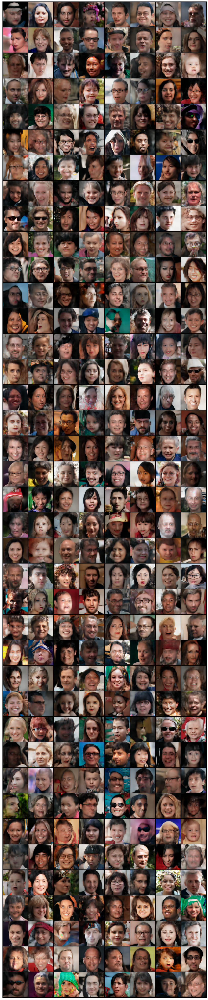

In [19]:
N_IMAGES = 312

show_images(generate(model['generatorm'], N_IMAGES), size=(8, 39))

In [ ]:
# 保存模型示例代码
print('===> Saving models...')
state = {
    'state': model.state_dict(),
    'epoch': EPOCHS                   # 将epoch一并保存
}
if not os.path.isdir('checkpoint'):
    os.mkdir('checkpoint')
torch.save(state, './checkpoint/autoencoder.t7')

In [ ]:
print('===> Try resume from checkpoint')
def readmodel():    
    try:        
        checkpoint = torch.load('gen_epoch_50.weights')
        model['generator'].load_state_dict(checkpoint)  
        
        checkpoint2 = torch.load('dis_epoch_50.weights')
        model['discriminator'].load_state_dict(checkpoint2)  
        
        print('===> Load last checkpoint data')
    except FileNotFoundError:
        print('Can\'t found autoencoder.t7')
readmodel()

In [ ]:
# with open('history.pkl', 'wb') as handle:
#     pickle.dump(history, handle, protocol=pickle.HIGHEST_PROTOCOL)
# with open(DATA_OUT + 'history.pkl', 'rb') as handle:
#     history = pickle.load(handle)
show_history(history)

# 3. Sample

In [ ]:
N_IMAGES = 560
show_images(generate2(model['generator'],model['generatorN'], N_IMAGES), size=(8, 70))

# 5. Visualization
Сделал сначала визуализацию, так проще понять accuracy после knn

In [ ]:
N_IMAGES = 1000

real_imgs = torch.Tensor()
for imgs, _ in dataloader:
    real_imgs = torch.cat([real_imgs, imgs])
    if real_imgs.shape[0] >= N_IMAGES:
        break

Посмотрим на распределение настоящих и фейковых изображений после t-SNE после 1, 3, 8, 20 и 50 эпохи

In [ ]:
# t-SNE presentation
ts_data = {} #1, 3, 8, 20,
for epoch in [ 50]:
    with open(f'imgs_epoch_{epoch}.pkl', 'rb') as handle:
        fake_imgs = pickle.load(handle)
    print('begin image cat:')
    imgs_flatten = torch.cat([
        real_imgs.flatten(start_dim=1)[:N_IMAGES, :],
        fake_imgs.flatten(start_dim=1)[:N_IMAGES, :]
    ])
    print('begin TSNE:')
    ts = TSNE(random_state=42, verbose=0).fit_transform(imgs_flatten)

    fig, ax = plt.subplots(figsize=(12, 12))
    plt.title(f'Epoch {epoch}')
    plt.scatter(ts[:N_IMAGES, 0], ts[:N_IMAGES, 1], label='real')
    plt.scatter(ts[N_IMAGES:, 0], ts[N_IMAGES:, 1], label='fake')
    plt.legend()
    
    ts_data[epoch] = ts

Чем ближе форма сгенерированного распределения к реальному, тем лучше генерация. При идеальной генерации облака точек будут совпадать, разделить их на два класса не получается, accuracy равно 0.5

# 4. Leave-one-out-1-NN classifier accuracy

Проверим, аккураси должно стремиться от 1 (отличаются полностью, легко разделить на 2 класса) к 0.5 (соседом может быть одинаково вероятно как реальное изображение, так и сгенерированное).

In [ ]:
labels = torch.cat([torch.ones(N_IMAGES), torch.zeros(N_IMAGES)])

# build model
model = KNeighborsClassifier(n_neighbors=1)

# define cross-validation method to use
cv = LeaveOneOut()

for epoch in [1, 3, 8, 20, 50]:
    # use LOOCV to evaluate model
    accuracies = cross_val_score(
        model, ts_data[epoch], labels, scoring='accuracy', cv=cv, n_jobs=-1
    )
    print(f'Epoch {epoch} mean accuracy: {accuracies.mean()}')